### University of Michigan - ROB 101 Computational Linear Algebra - Fall 2020

# Project 1: Robotic Mapping with LIDAR Data

#### Welcome to the world of Linear Transformations. 
In this project we will help you to experience how powerful matrix algebra is in handling large (HUGE) quantities of data. 

## Task 1 (10 Points)

In this task, you will plot simple shapes and apply different transformations. The goal is to learn a matrix version of what mathematicians call "affine transformations". You will learn a special way to write coordinates that roboticists use on a regular basis: *homogeneous coordinates*.

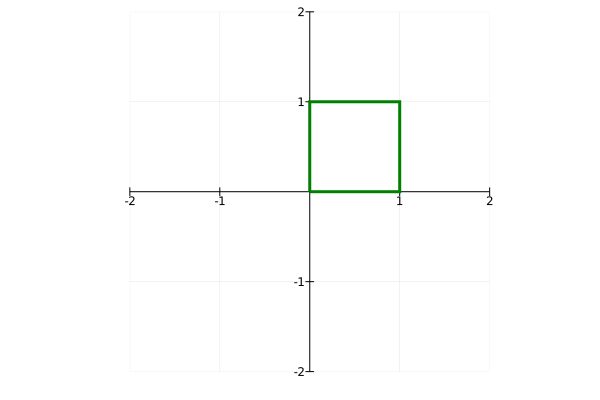

In [20]:
# Run me, do not change me! I am creating a set of points to form a square when plotted
using Plots
default(fmt = :png)

#= Define points to form a square, note there are five points, we need to come back
   to the first point to complete the square for plotting (connecting lines) =#

# [x1 y1; x2 y2; ...; x5 y5]
points = [0. 0.; 0. 1.;1. 1.; 1. 0.; 0. 0.]';

# x coordinates extracted from the array
x = points[1,:];

# y coordinates extracted from the array
y = points[2,:];

# plotting the array of points in the same plot as a coordinate frame 
plot(x,y, seriescolor = :green, aspect_ratio=:equal, xlims = (-2,2), ylims = (-2,2), 
    grid = true, framestyle = :origin, legend = false, linewidth=3)


### Here are three very important operations on points: 

a) translation, which means $\begin{bmatrix} x' \\ y' \end{bmatrix}=\begin{bmatrix} x \\ y \end{bmatrix} + \begin{bmatrix} t_x \\ t_y \end{bmatrix}$, where $t_x$ and $t_y$ are given constants. Here, x' is a new x point. It is not a transpose.

b) rotating an object by a given angle, which will will turn out to look like this 
$\begin{bmatrix} x'\\y'\end{bmatrix} = \begin{bmatrix}\cos{\theta}&-\sin{\theta} \\ \sin{\theta}&\cos{\theta}\end{bmatrix} \cdot \begin{bmatrix}x\\y\\ \end{bmatrix}$
where $\theta$ is the angle by which we wish to rotate a set of points in the counterclockwise direction, and finally

c) scaling the x and y coordinates of a set of points to stretch an object or contract it, potentially by diffrent amounts in the x and y directions. Scalling looks like this
$\begin{bmatrix} x'\\y' \end{bmatrix} = \begin{bmatrix}S_x&0\\0&S_y\\ \end{bmatrix} \cdot \begin{bmatrix}x\\y\\ \end{bmatrix}$

We will tackle these operations one by one in what follows. The first thing we notice is that rotation and scaling involve matrix-vector multiplication, while translation involves adding two vectors. Even though addition seems simpler than multiplication, in what you may pereceive as a perverse use of mathematics, we are going to show you how to turn translation into matrix multiplication! The fruit of our labor will be a uniform way in which to write down these three operations and that will simplify our manipulation of the 195.6 MB of LiDAR data.



### Part A: The first operation we will perform on our square is to translate it. The corresponding mathematical operation is called "translation" (2 points)

We will translate each point by -0.5 in x and -0.5 in y so as to center our square around the origin. 

**Your task:** Apply a translation $\begin{bmatrix} x \\ y \end{bmatrix} \mapsto \begin{bmatrix} x \\ y \end{bmatrix} + \begin{bmatrix} t_x \\ t_y \end{bmatrix}$ to the points that form the square using vector addition. We will then work toward using matrix multiplication. Here $\begin{bmatrix} t_x \\ t_y \end{bmatrix} = \begin{bmatrix} -0.5 \\ -0.5 \end{bmatrix}$. Store the translated points in an array called points2. 

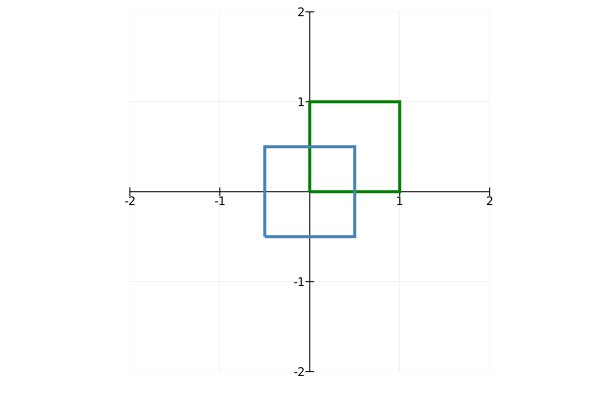

In [21]:
# Define the translation vector t
t = [-0.5; -0.5];

# Make a copy of the original points and call it points2
points2 = copy(points);

# Your job: modify the values of points2 so that the x-y values are indeed tanslated by the vector t
### BEGIN SOLUTION
for i in 1:size(points2,2)
    points2[:,i] = points2[:,i] + t;
end
### END SOLUTION

x2 = points2[1,:];
y2 = points2[2,:];

plot!(x2,y2, seriescolor = :steelblue, aspect_ratio=:equal, xlims = (-2,2), ylims = (-2,2), 
    grid = true, framestyle = :origin, legend = false, linewidth=3)

### Part B: Translation as matrix multiplciation in homogeneous coordinates (1 point)

Our goal here is show how the operation of translation can be written as a matrix-vector multiplication. Roboticists want to do this so that the three operations, tanslation, rotation, and scaling can be written in exactly the same format. This extra bit of work makes manipulating huge files of LiDAR data much easier.

We pose the question: how can we use matrix multiplication to apply a translation? The answer is, we need to use a trick that's called homogeneous coordinates. This is a simple operation on our data as we just need to append a 1 to each point [x;y]. That is, we convert $\begin{bmatrix} x \\ y \end{bmatrix}$ to homogeneous coordinates by $$\begin{bmatrix} x \\ y \\ 1 \end{bmatrix} .$$
The inverse operation, taking a vector of homoegeneous coordinates and dropping the 1, produces the original vector [x;y]. This seems almost too simple to bother mentioning, but we do it anyway!

We claim that we can perform vector translation by multiplying a vector in homogemeous coordinates by the matrix $$ T = \begin{bmatrix} 1 & 0 & t_x \\ 0 & 1 & t_y \\ 0 & 0 & 1 \end{bmatrix}.$$

Let's see if this actually works $$ \begin{bmatrix} 1 & 0 & t_x \\ 0 & 1 & t_y \\ 0 & 0 & 1 \end{bmatrix} \cdot \begin{bmatrix} x \\ y \\ 1 \end{bmatrix} = \begin{bmatrix} x + t_x \\ y + t_y \\ 1 \end{bmatrix}.$$
And when we drop the 1 to put our transformed vector back in the ordinary Cartesian coordinates we have
$$ \begin{bmatrix} x + t_x \\ y + t_y \end{bmatrix},$$
ta da! It's Ok if you're not overwhelmed by this operation. We like to build toward a crescendo! 

<!-- ## Is this statement needed here?
In general a 2D affine transformation takes the following form $$H_{3\times 3} = \begin{bmatrix} A_{2\times 2} & t_{2\times 1} \\ 0_{3\times 1} & 1 \end{bmatrix}.$$
If $A$ is a rotation matrix, then $H$ will be a *rigid body transformation*. -->

**A task that we will do for you:** Implement the translation of the square using homogeneous coordinates and the above translation matrix. Pay attention here because there is code that you will want to copy and modify just a little bit when you perform rotation and scaling in homogeneous coordinates!

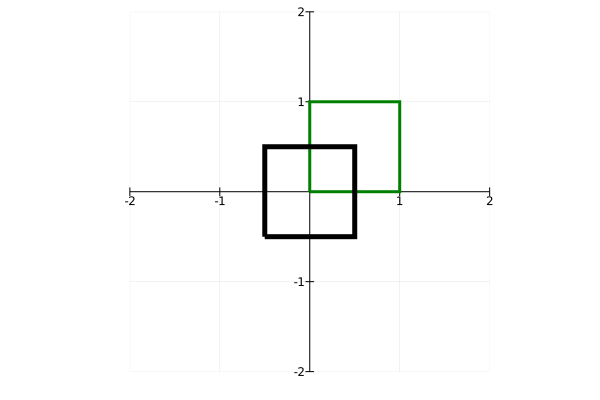

In [22]:
# Define the translation matrix T
T = [1 0 -0.5;0 1 -0.5; 0 0 1];

# Make a copy of the original points
points3 = copy(points);
# Append 1 to each point to make homogeneous coordinates
points3 = [points3; ones(1,5)];

# Apply the translation to each of the points that form our square
# We use a for loop because later, when you get to LiDAR data, you will have thousands 
# points and not just 5 (x,y)-pairs.
for i in 1:size(points3,2)
    points3[:,i] = T * points3[:,i];
end


# Extract x and y coordinates and throw away the last one
x3 = points3[1,:];
y3 = points3[2,:];

# Don't worry too much about the plot commands for Project 1.
# They are long and not intuitive. We will give them to you. 
plot!(x3,y3, seriescolor = :black, aspect_ratio=:equal, xlims = (-2,2), ylims = (-2,2), 
    grid = true, framestyle = :origin, legend = false, linewidth=5)

### Part C: Rotation in Homegenous Coordinates (2 points)

We now use the 2D rotation matrix in homogeneous coordinates:

$\begin{bmatrix} x'\\y'\\1 \end{bmatrix} = \begin{bmatrix}\cos{\theta}&-\sin{\theta}&0\\\sin{\theta}&\cos{\theta}&0\\0&0&1\\ \end{bmatrix} \cdot \begin{bmatrix}x\\y\\1\\ \end{bmatrix}$

**Your task:** Rotate our square in the x-y plane by 45 degrees ($\pi/4$). Build the transformation matrix to transform the square.     

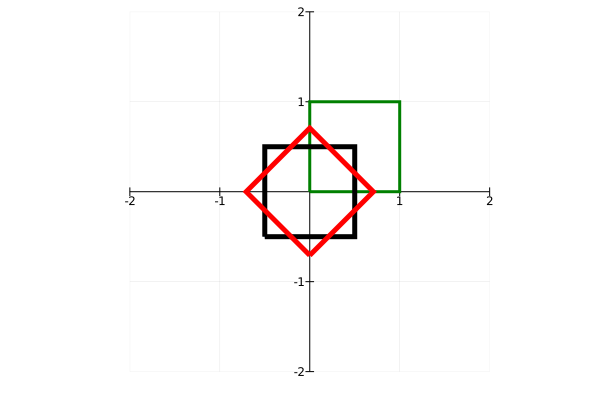

In [23]:
# Finish this portion of the the code to do the matrix multiplication that does the Tranformation
# Modify the points3 array to have the result of the transformation, like we did before!

### BEGIN SOLUTION
theta = pi/4;
T = [cos(theta) -sin(theta) 0; sin(theta) cos(theta) 0; 0 0 1];
for i in 1:size(points3,2)
    points3[:,i] = T * points3[:,i];
end
### END SOLUTION

# Extract x and y coordinates and throw away the last one
x3 = points3[1,:];
y3 = points3[2,:];

plot!(x3,y3, seriescolor = :red, aspect_ratio=:equal, xlims = (-2,2), ylims = (-2,2), 
    grid = true, framestyle = :origin, legend = false, linewidth=5)

### Part D: Scaling (2 points)

Next, we're going to scale the square, which means that we "stretch" its sides like a rubber band. Mathematicians sometimes call such transformations *non-rigid*. The scale transformation matrix in 2D is given as:

$\begin{bmatrix} x'\\y'\\1 \end{bmatrix} = \begin{bmatrix}S_x&0&0\\0&S_y&0\\0&0&1\\ \end{bmatrix} \cdot \begin{bmatrix}x\\y\\1\\ \end{bmatrix}$


**Your task:** Scale the rotated square using $S_x = 1.5$ and $S_y = 0.5$

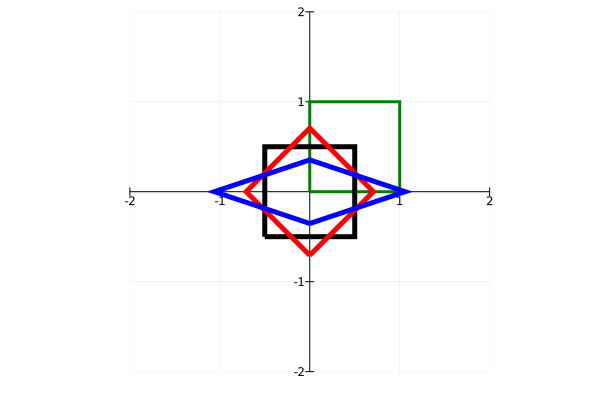

In [24]:
# Finish this portion of the the code to do the matrix multiplication that does the Tranformation
# Modify the points3 array to have the result of the transformation, like we did before!


### BEGIN SOLUTION
sx = 1.5;
sy = 0.5;
T = [sx 0 0;0 sy 0; 0 0 1];
for i in 1:size(points3,2)
    points3[:,i] = T * points3[:,i];
end
### END SOLUTION

# Extract x and y coordinates and throw away the last one
x3 = points3[1,:];
y3 = points3[2,:];

plot!(x3,y3, seriescolor = :blue, aspect_ratio=:equal, xlims = (-2,2), ylims = (-2,2), 
    grid = true, framestyle = :origin, legend = false, linewidth=5)

### Part E: Putting it all together: Affine Transformations (3 points)


All the transformations we have done so far (translation, rotation, and scaling), and even combinations of them, are called Affine Transformations.

When we work with big data sets and we need to apply a sequence of translations, rotations, and scalings to a set of points, you can imagine that keeping track of everything during the transformation processes could become cumbersome over time. 

The saving feature of using the abstract notion of an Affine Transformation is that we can build a complicated transformation by multiplying together the individual transformations considered one at at time. For example, let's suppose we want to translate a set of points by [-0.5;-0.5], then rotate the translated object counterclockwise by 45 degrees, and then finally scale the translated and rotated object! That's a lot of transformations! Yes, but can write the overall transformation as simply as this


$$T = \begin{bmatrix}1.5&0&0\\0&0.5&0\\0&0&1\\ \end{bmatrix} \cdot \begin{bmatrix}\cos(\pi/4)&-\sin(\pi/4)&0\\\sin(\pi/4)&\cos(\pi/4)&0\\0&0&1\\ \end{bmatrix} \cdot \begin{bmatrix}1&0&-0.5\\0&1&-0.5\\0&0&1\\ \end{bmatrix}$$

What have we done? We prepared the overall homegeneous transformation by multiplying three individual homogeneous transformations, which we can then apply all at once to our point [x;y], once we express it in homogeneous coordinates as [x;y;1]

Is your mind blown yet?

#### Your task is to implent the above sequence of transformations on the original square. 

In the next cell, build the transformation matrix T and then aply it to our vector "points". Whatever you do, do not multiply out the above matrices by hand and then enter one matrix. Write T as the product of three homegeneous matrices and let Julia do the matrix multiplication for you.

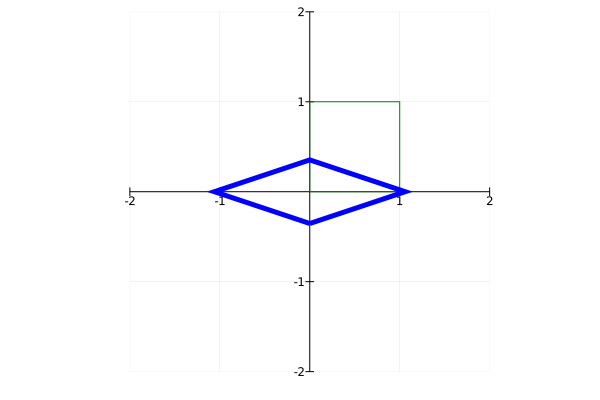

In [25]:
# We start you out by making a copy of the original points and appending 1 to each point.
# For later use, note the very efficient manner in which we add a row of 1's to the array points.
points4 = [copy(points); ones(1,5)];

# Finish this portion of the the code to do the matrix multiplication that does the Tranformation
# Modify the points4 array to have the result of the affine transformation this time

### BEGIN SOLUTION
T = [sx 0 0;0 sy 0; 0 0 1]*[cos(theta) -sin(theta) 0; sin(theta) cos(theta) 0; 0 0 1]*[1 0 -0.5;0 1 -0.5; 0 0 1];
for i in 1:size(points4,2)
    points4[:,i] = T * points4[:,i];
end
### END SOLUTION

# Extract x and y coordinates and throw away the last one
x4 = points4[1,:];
y4 = points4[2,:];

plot(x,y, seriescolor = :green, aspect_ratio=:equal, xlims = (-2,2), ylims = (-2,2), 
    grid = true, framestyle = :origin, legend = false)

plot!(x4,y4, seriescolor = :blue, aspect_ratio=:equal, xlims = (-2,2), ylims = (-2,2), 
    grid = true, framestyle = :origin, legend = false, linewidth = 5)

# Task 2 (2 Points)

In this task, we will work with 2D point clouds. This is our final step before moving onto the 3D point clouds collected with Cassie Blue. Are you getting anxious? 

A point cloud is simply a collection of points in space (3D and more) or a plane (2D). So for a 2D point cloud, the first two rows of the data contain the x and y coordinates of our point respectively. And the third row contains additional information about our point, which for the case of LiDAR sensor is the Intensity, and for a camera is the RGB values (red, green, blue color information). 

For your 2D pointcloud, think of it as a camera image. The pointcloud is thus in a plane and the color data is given in simplified rgb encoding with values between (0, 1). Think about it as a rainbow, where red has value 0 and blue has value 1. 

We provide you a distorted image, which makes it very hard to read the text. We want to apply an affine transformation to correct the point cloud to make it readable. Let's first read the contents of the file "question_image.csv" into an array (use the function *readdlm*), and plot the points in a scatter plot. This part is provided. 

In [26]:
using DelimitedFiles
using Plots
default(fmt = :png)

pointcloud = readdlm("data/question_image.csv",',');

# The x and y coordinates for the first 2 rows of the data an can be extracted from the array separately
point_data = pointcloud[1:2,:];

# The intensity data of the pointcloud forms the last row, and can be saved separately
color_data = pointcloud[3,:];

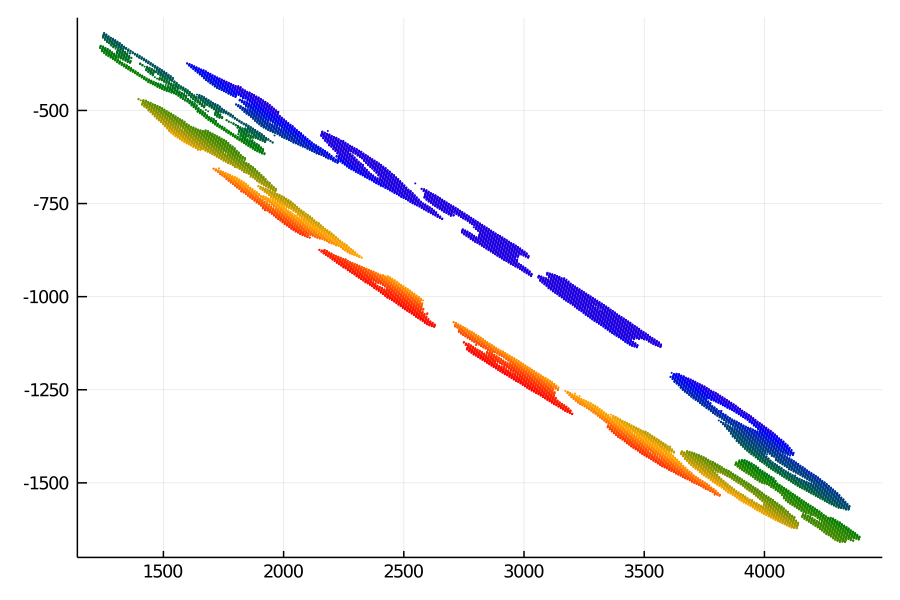

In [27]:
# Plot the 2D point cloud data with intensity values!
plot(point_data[1,:], point_data[2,:], seriestype = :scatter, markersize = 0.8, 
    markerstrokewidth = 0, dpi = 150, markercolor  = cgrad(:rainbow, rev = true), 
    marker_z = color_data, legend = false)

Luckily, the homogeneous transformation for correcting the image is known to be

$$ T = \begin{bmatrix}-0.09239&0.038268&300\\-0.38268&-0.923879&165\\0&0&1\\ \end{bmatrix}$$
      
**Your task:** Apply $T$ to the distorted point cloud and plot the corrected image.

In [30]:
X = [copy(point_data); ones(1,size(point_data,2))]; # Create homogeneous points

#= This part of the code should accomplish the following:
1. Build the Transformation matrix
2. Loop over all the points (i.e. iterate from index 1 to number of columns in X) and multiply the Transformation 
   to get what we call a transformed pointcloud. 
3. Save your results directly in the X array, don't change the names, our plots depend on it! =#

### BEGIN SOLUTION
T = [-0.09239 0.038268 300; -0.38268 -0.923879 165; 0 0 1];
for i in 1:size(X,2)
    X[:,i] = T * X[:,i];
end
### END SOLUTION

In [31]:
### BEGIN HIDDEN TESTS
i = rand(1:size(X,2));
test_X = [copy(point_data); ones(1,size(point_data,2))];
@assert T == [-0.09239 0.038268 300; -0.38268 -0.923879 165; 0 0 1]
@assert X[:,i] == T * test_X[:,i]
### END HIDDEN TESTS

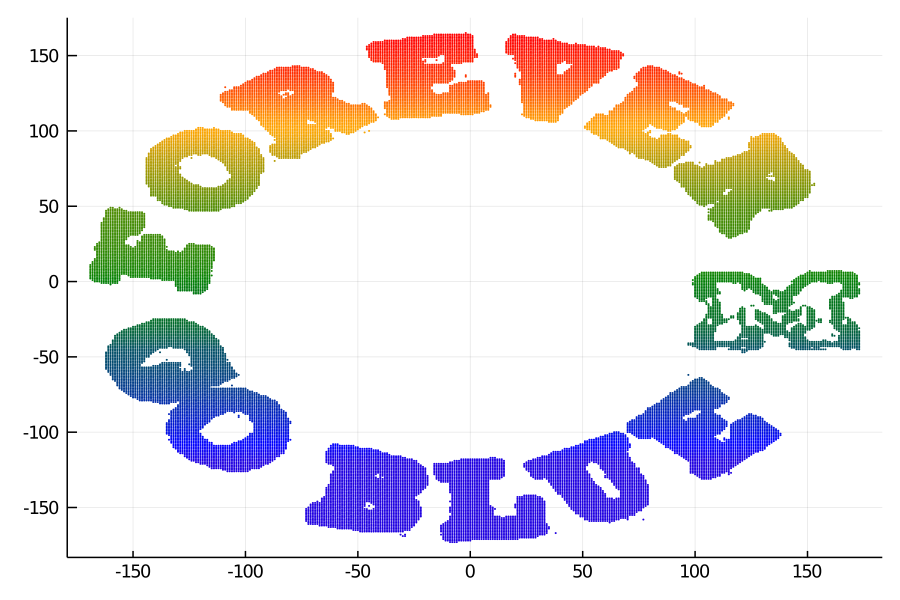

In [32]:
# Only run plot if you passed the autograding, it will take a while to generate the plot if too many people are working at the same time
plot(X[1,:], X[2,:], seriestype = :scatter, markersize = 0.8, 
    markerstrokewidth = 0, dpi = 150, markercolor  = cgrad(:rainbow, rev = true), 
    marker_z = color_data, legend = false)

# Task 3 (8 Points)

As a motivator. At the end of this Task you will able to generate a plot like this one:



<img src="https://i.postimg.cc/qBFQ1ZZF/Task3.png" alt="Go Blue" width="900">



Now that we have seen the power of matrix tranformations in 2D, let's move on to the more challenging case of 3D. We won't have you worry about the plotting in this case either as a plotting code is given to you. 

Your first task is to plot the raw point cloud data obtained from Cassie's LiDAR over a period of 1 second. Running Cassie's LiDAR at 10 Hz, we have collected 10 different scans of LiDAR data over the one second interval and combined them into one big file. You will see how huge the file is while working on this problem, and appreciate what it means to do math at scale!

The collected data is in the frame of the LiDAR, which moves with the robot. See the PDF file for how the data is organized. If you have not read it carefully, stop now! To help you out with the data management, which is not a focus of ROB 101, we have built for you a data_parser function that organises the information from a slew of csv files into different meaningful arrays. The function ```data_parser``` will parse each second of your data set into five different arrays that you will need for this problem. 

The input to the ```data_parser``` is time interval number of the data set, with $id \in \{ 9, 10, \cdots, 13\}$ which gives the identify of a data set (the corresponding time). It must be passed as an argument to the function and the data returned should be saved in the same order that it is produced by parser. See the first cell in Part A for more details. 

The different arrays that will contain the data are given as:

- pointcloud_data: This has the xyz coordinates of the Pointcloud

- Intensity_data: The LIDAR Intensity data is saved in the array called Intensity_data

- R: Rotation Matrix 

- T: Translation Matrix

- pose: Gives the true position (xyz, column 1) and orientation(column 2) of the robot

We will see an example call to this function very soon in Part A!


In [33]:
using DelimitedFiles
using Plots
default(fmt = :png)

# This is the data parser and helper functions block. Run as is.

function data_parser(id)
    # load point cloud from file
    points = readdlm(string("data/cassei_data/Frame_",string(id),"/pointcloud.csv"),',');
    pointcloud_data = points[1:3,:]; # xyz
    Intensity_data = points[4,:]; # intensity
    # load the different transformation from the file, connect with the information learned in Task 1 
    Transformations = readdlm(string("data/cassei_data/Frame_",string(id),"/Transformations.csv"),',');
    R = Transformations[:,1:3]; # rotation
    t = Transformations[:,4]; # translation
    # Also get the position of the the robot from another file 
    pose = readdlm(string("data/cassei_data/Frame_",string(id),"/Position.csv"),',');
    return (pointcloud_data, Intensity_data, R, t, pose)
end

# Example call to the function, the data for interval id 10 of the video is being parsed 
# (pointcloud_data,Intensity_data,R,T,position) = data_parser(10)

# Display the size of the pointclouds at the t = 10 sec, or interval 10 of the video. 
# display(size(pointcloud_data))

# This function will apply a transformation to all points

#= note that this is the exact same function from Task generalized to handle matrices of all sizes, instead of just 5. 
How do we note that? look at the iterator i, and its end value is determined by the number of colmuns that are in matrix points =#

function affine_transform(points, H)
    # Make a copy of the original points and append 1 to each point, (Homogenizing)
    transformed_p = [copy(points); ones(1,size(points,2))];
    # Transform 3D points, looping over all points and multiplying the Transformation matrix, exactly like Task 1!
    for i in 1:size(transformed_p,2)
        transformed_p[:,i] = H * transformed_p[:,i];
    end
    # Remember to return the de homogenized array, i.e.,
    # transformed_points should have same size as input points 
    
    return transformed_p[1:3,:];
end

#= A function to get robot heading at its position, this is more of a hack that we use to get the a cute little arrow 
   of our position estimate when plotting, you are definitely not expected to understand it, we barely do ourselves! =#

function robot_arrow(pose)
    position = pose[:,1]; # position
    (roll,pitch,yaw) = pose[:,2]; # orientation
    # extract rotation axis! 
    u = [1*cos(yaw)cos(pitch)]
    v = [1*sin(yaw)cos(pitch)]
    w = [1*sin(pitch)]
    return (position, u, v, w)
end

# Define the viewing window size for setting x and y axis limits, a plotting parameter
window_size = 15
min_x = -window_size;
min_y = -window_size;
max_y = window_size;
min_z = 0;
max_z = 2*window_size;
max_x = window_size;

### Part A (4 points)
Here we are showing you how the data is parsed and saved into arrays. You have to pay attention. You are not required to modify any of the code. 

The next cell reads the raw pointcloud in the last data collection instant, which is at time 13 seconds (id = 13). This must be passed as the interval id to our function ```data_parser```. As discussed before, the function gives us pointcloud data, intensity data, the R, t matrices to build an affine Transformation, and finally an estimate of the robot pose. 

In [34]:
# Run me, do not change me
# Example call to the function, to get the data at time = 13 seconds of data collection
id = 13;
# save the data into different arrays
(point_data, intensity_data, R, t, pose) = data_parser(id);

# Lets see the size of the pointcloud and appreciate the challenge of the problem at hand

size(point_data)

(3, 696496)

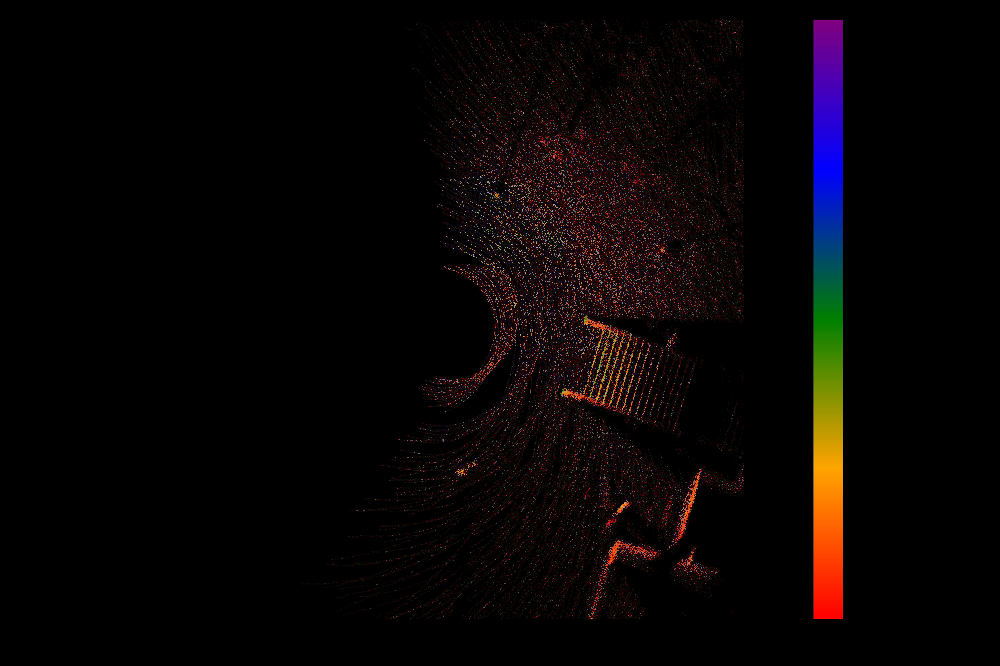

In [35]:
# Run me, don't change me.
#
# Finally, let's plot the point cloud data. Run this cell as it is to see a plot of the raw pointcloud
# It takes around 5 seconds to plot, wait for it!
Plots.plot()
Plots.plot!(point_data[1,:], point_data[2,:], point_data[3,:],
    xlims = (min_x,max_x), ylims = (min_y,max_y), zlims = (min_z,max_z), 
    seriestype = :scatter3d, markersize = 0.1, camera = (0,90), dpi = 1080,
    markercolor = cgrad(:rainbow, rev = true), marker_z = intensity_data'', background_color = :black, 
    foreground_color = :black, legend = false, aspect_ratio = 1)

In [36]:
# Run me, don't change me
# Obtain an arrow for plotting our robot's position and orientation. 
(pos, u, v, w) = robot_arrow(pose);

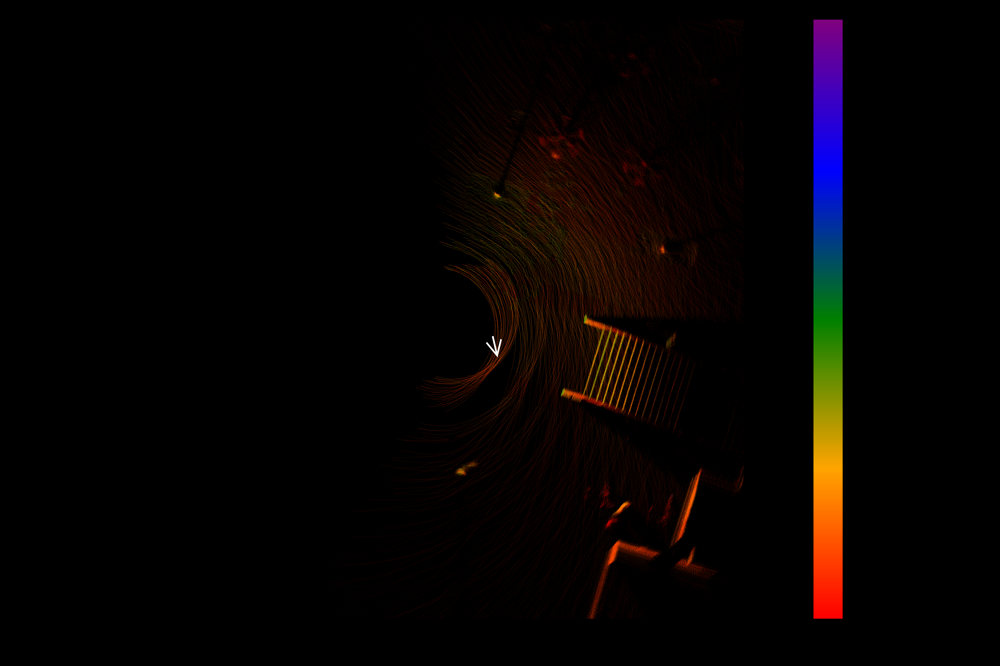

In [37]:
# Run me, don't change me
# Finally, lets plot our robot's pose on the same plot, and note the point cloud position with respect to the robot's pose
Plots.plot!(pos[1,:], pos[2,:], pos[3,:], seriescolor = :white, seriestype = :quiver, 
    projection = "3d", quiver = (u,v,w), arrow = (10,10))
display(plot!())

Take a close look at the plot you have just generated. As explained in the PDF, the LiDAR is mounted on top of the robot and, the concentric circles you see in the LiDAR points should be centered about the robot. What we see, instead, is that the data is translated and rotated with respect to the robot. We need to fix that by applying a homogeneous trasformation to the point cloud data.

#### Transform

Time to correct our blunder now! Transform the point cloud into the world frame and plot it with the position arrow as we did before and compare the two plots. You will have to build an affine transformation matrix from the Rotation and Translation matrix given to you.
We know that an affine transformation can be represented as: \begin{bmatrix}\ & & & \\ &R& &T \\ & & & \\0&0&0&1\\ \end{bmatrix} 

Transform your pointcloud and plot the position like we did before. 
Do you see concentric circles of LiDAR originating from our position estimate?!

In [38]:
# This block works fine

Plots.plot()


# Build the transformation from the rotation and translation matrices in your code, that we will use to Transform 
# our pointcloud with, save the result as H matrix. 

### BEGIN SOLUTION

H = [R t;0 0 0 1];

### END SOLUTION




Before we go any further and use the transformation that you have build, let's check if you got it right! Please run the  autograder cell! If you fail the autograder test, then go back and see if you can fix your transformation matrix!

In [39]:
# autograder cell
### BEGIN HIDDEN TESTS
@assert H == [R t;0 0 0 1]
### END HIDDEN TESTS

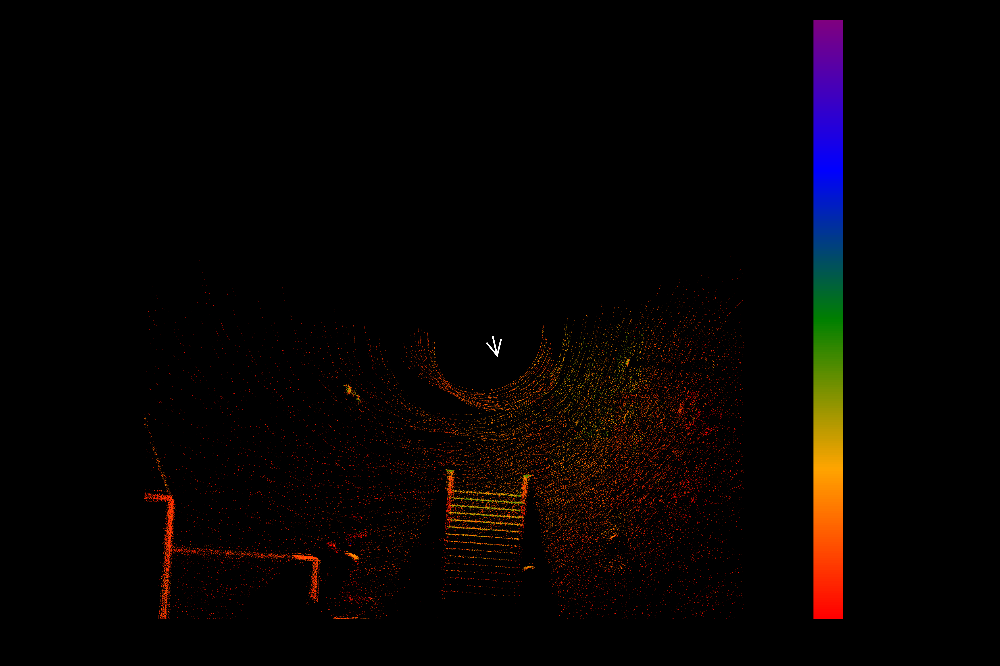

In [40]:
# Run me, don't change me.
# We are using the transformation matrix that you have just built and verified with the autograder! 
# (Right, you did verify it?)

# Lets finally transform and plot

# Transform data by calling the predefined function generalised from Task 1
transformed_points = affine_transform(point_data, H);

# Visualize
Plots.plot!(transformed_points[1,:], transformed_points[2,:], transformed_points[3,:],
    xlims = (min_x,max_x),ylims = (min_y,max_y),zlims = (min_z,max_z), 
    seriestype = :scatter3d,  markersize = 0.1, camera = (0,90), dpi = 1080, 
    markercolor = cgrad(:rainbow, rev = true), marker_z = intensity_data'', background_color = :black, 
    foreground_color = :black, legend = false, aspect_ratio = 1)

# Add robot pose to the plot
Plots.plot!(pos[1,:], pos[2,:], pos[3,:], seriescolor = :white, seriestype = :quiver, 
    projection = "3d", quiver = (u,v,w), arrow = (10,10))
display(plot!())


### Part B ( (3+1) points)

#### BUILDING A MAP and fusing different LiDAR scans!

We now understand how to go from a sensor frame to a world frame. Let us start to build a map by fusing data over multiple time periods. As you will notice from the figure you just made for one second of data, LiDAR scans collected over 1 second are not enough to give us full scene understanding and we therefore need to fuse multiple scans together for a more vivid picture. As much as we would like to give you the full data set and have this be as impressive as the Cassie video, due to time constraints, we are going to have you work with only five seconds (time = 9 to 13 seconds) instead of three minutes of data.

However, one takeaway from this problem should be that the robot is continuously moving and we need to compensate for its motion with an approriate transformation matrix that converts the LiDAR in the sensor frame to LiDAR data in the world frame. The transformation has to be continuously estimated in real-time on the robot. That part of the problem you can learn about in ROB 501 and ROB 530. There is an entire research area that focuses on calculating the best approximate transformations from the moving LiDAR to the fixed world frame. 

Are you convinced yet that we cannot possibly do all of this by hand? In fact to get a computer to this as fast as we needed to, we had a team of grad students work tirelessly for years, and then at the end of it all, we had 50 almost all freshmen (Go team ROB-101!), take that data and visualize and manipulate it, to see for themselves that our algorithm indeed works! 


In [89]:
# Part B

# Iterate over all the clouds over the interval of 9-13 seconds, and apply the transformation and plot in the same plot
# The code will take a while to run, so patience grasshopper!
final_points = [];
final_intensity = [];
for i = 9:13
    transformed_points = [];
    
    #= Your solution should sccomplish the following:
    1. Parse the data for the ith time interval using the data_parser function save it in the arrays with the SAME NAME like we did before
    2. Build the Transformation for time interval, using the R, t data
    3. Finally transfor your pointcloud and save the result in an array called transformed_points =#
    
    ### BEGIN SOLUTION  
    (point_data, intensity_data, R, t, pose) = data_parser(i);
   
    H = [R t;0 0 0 1];
     
    transformed_points = affine_transform(point_data, H);
    ### END SOLUTION
    if(i==9)
        final_points = copy(transformed_points);
        final_intensity = intensity_data';
    else
    final_points = [final_points transformed_points];
    final_intensity = [final_intensity intensity_data'];
    end
    
end

In [90]:
# autograder cell
### BEGIN HIDDEN TESTS
test_final_points = [];
for i = 9:11
    transformed_points = [];
    
    #= Your solution should sccomplish the following:
    1. Parse the data for the ith time interval using the data_parser function save it in the arrays like we did before
    2. Build the Transformation for time interval, using the R, t data
    3. Finally transfor your pointcloud and save the result in an array called transformed_points =#
    
    ### BEGIN SOLUTION  
    (point_data, intensity_data, R, t, pose) = data_parser(i);
    
    H = [R t;0 0 0 1];
     
    transformed_points = affine_transform(point_data, H);
    ### END SOLUTION
    if(i==9)
        test_final_points = copy(transformed_points);
    else
        test_final_points = [test_final_points transformed_points];
    end
end
@assert final_points[:,1:size(test_final_points,2)] == test_final_points
@assert size(final_points) == (3, 3522091)
### END HIDDEN TESTS

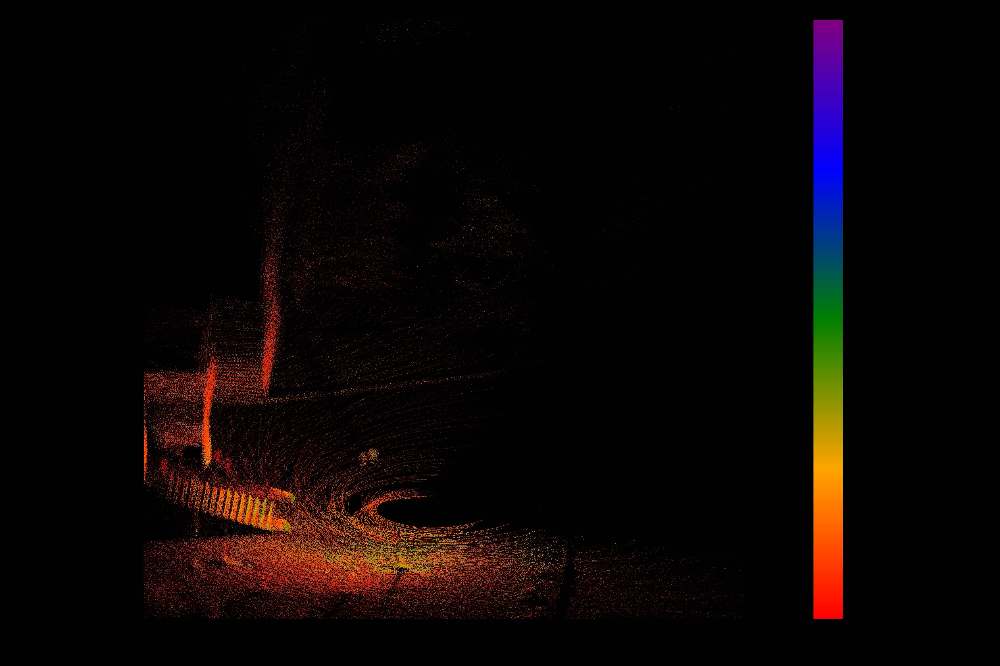

In [91]:
# Again, this will take a while to plot! 
Plots.plot()
# Update the plot
    Plots.plot!(final_points[1,:], final_points[2,:], final_points[3,:],
        xlims = (min_x,max_x), ylims = (min_y,max_y), zlims = (min_z,max_z), 
        seriestype = :scatter3d, markersize = 0.1, camera = (90,45), dpi = 1080, 
        markercolor = cgrad(:rainbow, rev = true), marker_z = final_intensity', background_color = :black, 
        foreground_color = :black, legend = false, aspect_ratio = 1)

display(plot!())

### Lets Make a video

Amazing, so now you have built a map of the staircase in our video!
Next step is simply iterating over all these frame and making a gif and see it build that map in real time. Just copy your code from the previous question inside the loop iterating over all frames to build gif. And this time also, we will add the position of the robot in the animation, seen as the white dot. 

9

10

11

12

13

making the gif!!

┌ Info: Saved animation to 
│   fn = C:\Users\Tribhi Kathuria\Documents\ROB-101\UMich-ROB-101\projects\project1\stairs_walking_five_seconds_zoomed_thirty.gif
└ @ Plots C:\Users\Tribhi Kathuria\.julia\packages\Plots\6RLiv\src\animation.jl:104


Plots.AnimatedGif("C:\\Users\\Tribhi Kathuria\\Documents\\ROB-101\\UMich-ROB-101\\projects\\project1\\stairs_walking_five_seconds_zoomed_thirty.gif")
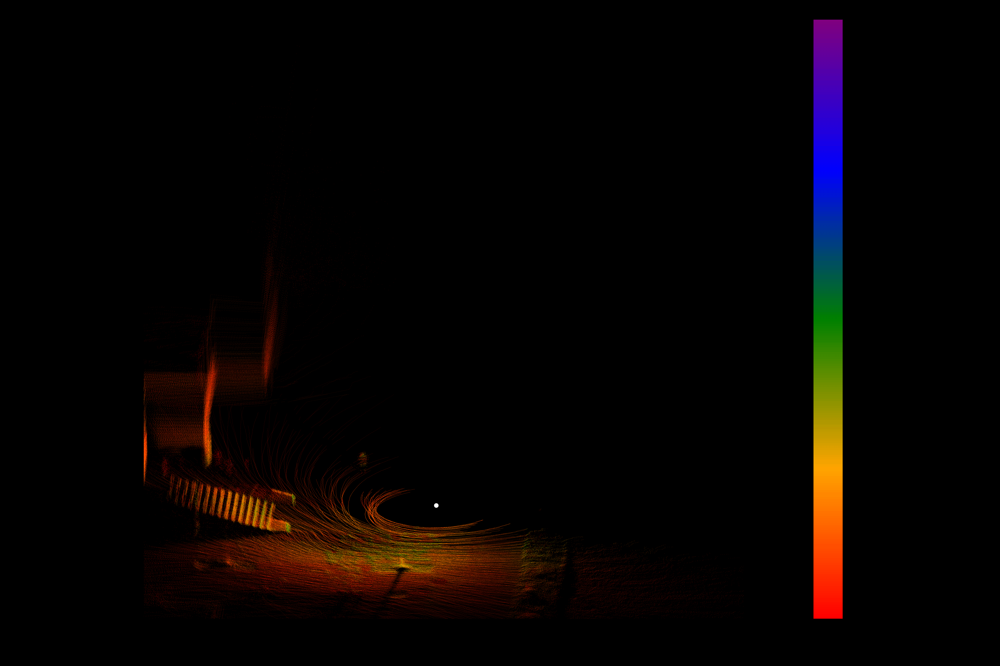

In [19]:

Total_Frames = 13;
Plots.plot()
# Build an animation!
start_index = 9;
prev_pose = copy(pose);
anim = @animate for i = start_index:Total_Frames
    transformed_points = [];
    # COPY YOUR CODE HERE
    
    ### BEGIN SOLUTION  
    (point_data, intensity_data, R, t, pose) = data_parser(i);
    
    H = [R t;0 0 0 1];
     
    transformed_points = affine_transform(point_data, H);
    ### END SOLUTION
    Plots.plot!(transformed_points[1,:], transformed_points[2,:], transformed_points[3,:],
        xlims = (min_x,max_x), ylims = (min_y,max_y), zlims = (min_z,max_z), 
        seriestype = :scatter3d, markersize = 0.1, camera = (90,45), dpi = 1080, 
        markercolor = cgrad(:rainbow, rev = true), marker_z = intensity_data'', background_color = :black, 
        foreground_color = :black, legend = false, aspect_ratio = 1)
    
    # A Hack for plotting the position
    if(i!=start_index)
        # Plot your previous position with a black dot everytime except the first
        Plots.plot!([prev_pose[1,1]],[prev_pose[2,1]],[prev_pose[3,1]],seriescolor = :black, markersize = 2, seriestype = :scatter3d);
    end
    
    Plots.plot!([pose[1,1]],[pose[2,1]],[pose[3,1]],seriescolor = :white, markersize = 2, seriestype = :scatter3d);
    display(i);
    prev_pose = copy(pose);
end
print("making the gif!!")
gif(anim, "stairs_walking_five_seconds_zoomed_thirty.gif", fps = 1)